In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=a97a0f6022bc0c2aff849453ba823cfb9205bab703e34619a0ae07b624b7a114
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


[==================================================] 9128 bytes downloaded
Downloaded and uncompressed: diabetes-dataset-for-beginners
Data source import complete.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB
None
       Pregnancies     Glucose  BloodPressure  SkinThickness     Insuli

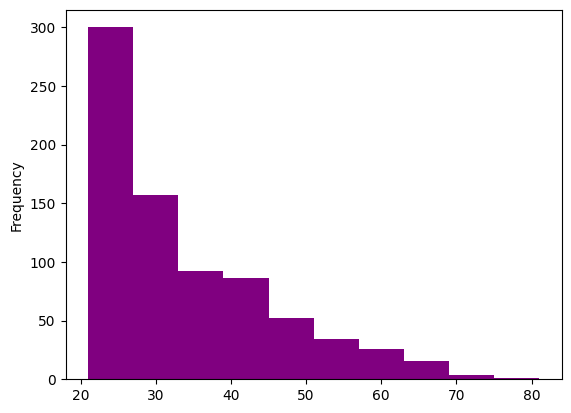

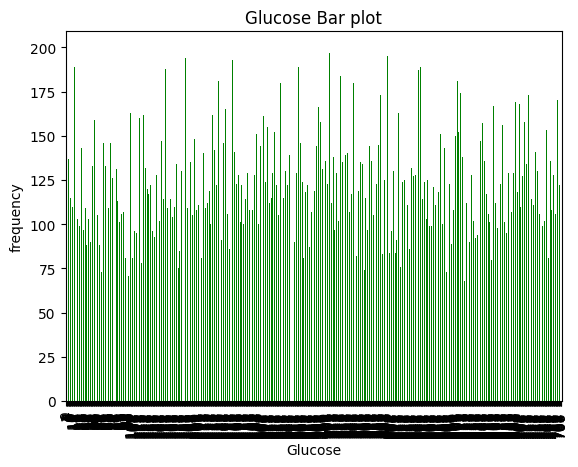

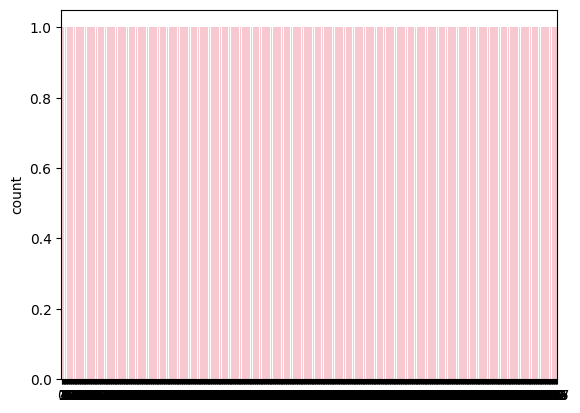

<ipython-input-9-a31d0b64c867>:103: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=data["Pregnancies"], palette="viridis")


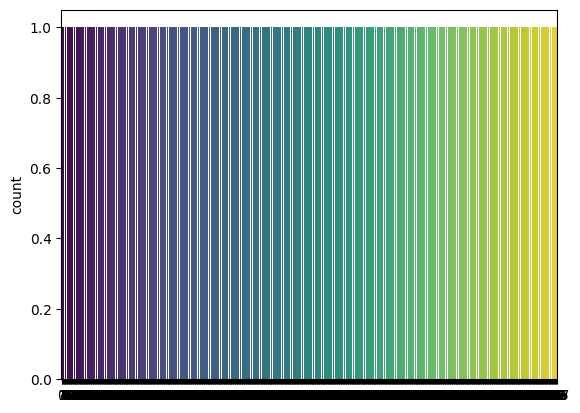

<ipython-input-9-a31d0b64c867>:106: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.3`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  sns.violinplot(data=data, x="Age", y="BMI", color="blue", split=False, cut=0, bw=.3, inner="stick")


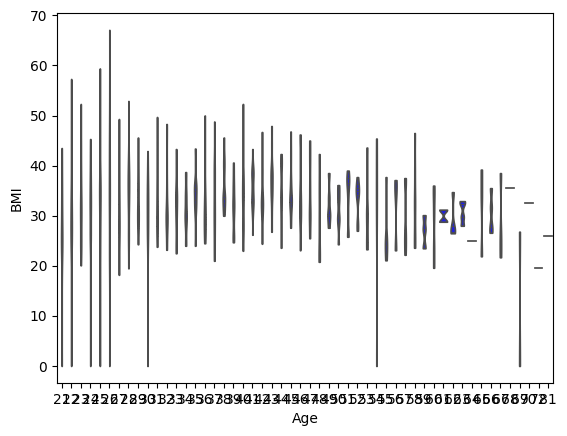

<ipython-input-9-a31d0b64c867>:109: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='count'` for the same effect.
  sns.violinplot(data=data["BMI"], color="pink", split=False, cut=0, bw=.3, inner="stick", scale="count")
<ipython-input-9-a31d0b64c867>:109: FutureWarning: 

The `bw` parameter is deprecated in favor of `bw_method`/`bw_adjust`.
Setting `bw_method=0.3`, but please see docs for the new parameters
and update your code. This will become an error in seaborn v0.15.0.

  sns.violinplot(data=data["BMI"], color="pink", split=False, cut=0, bw=.3, inner="stick", scale="count")


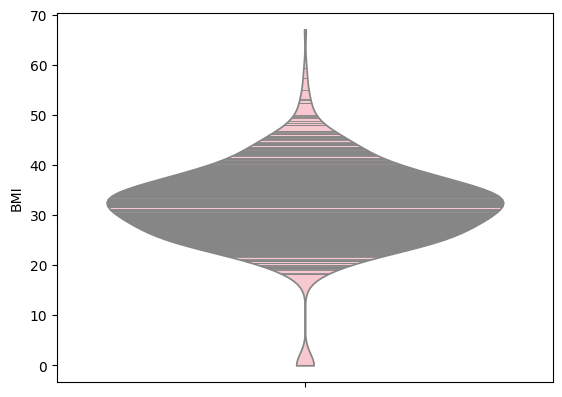

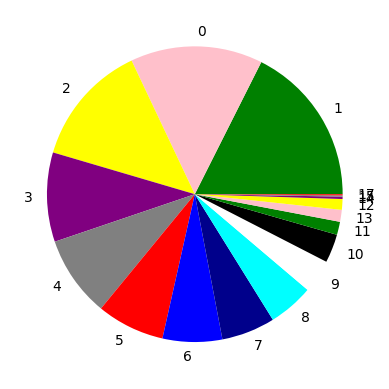

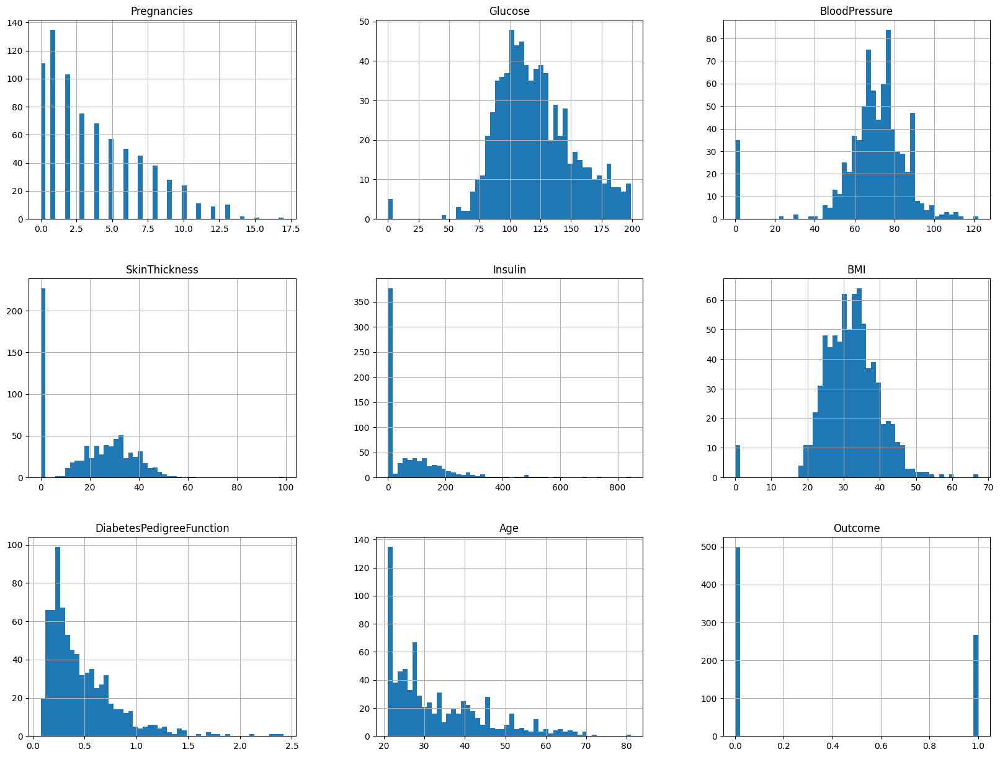

Accuracy Score: 0.7207792207792207
Confusion Matrix:
 [[77 22]
 [21 34]]
Classification Report:
               precision    recall  f1-score   support

           0       0.79      0.78      0.78        99
           1       0.61      0.62      0.61        55

    accuracy                           0.72       154
   macro avg       0.70      0.70      0.70       154
weighted avg       0.72      0.72      0.72       154



/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [ ]:
import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

from lime import lime_tabular
from lime.lime_tabular import LimeTabularExplainer

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'diabetes-dataset-for-beginners:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F1956887%2F3226898%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240313%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240313T074223Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3Da6b567675f0d737b66382acf2dfe05d9e9f863390be32e54d5452c8f10e5b56dfb59e3abdbfb3d0434df239e25b8f160dc3dcabda1f815a749a4176b59790a63c5258f76de631cba3d55bd70f41d4df95f469a3ade014db491aef53474a7deba883aa577dd8bac7dc555cd62f7ae7257e923a9e1b96019a9b5d97feba7548a4ab069e88325fac870996c47b890bf2bd1de27ea8f1588e2b168df7f0fb9e31c5abc2eaaa353cbb8dab19e24d561152aff4556a0a561f1fcad4a736bfb629d872fb2333054e3480358f0f21e501aba2aa20cba7a117304f4452abd8fce63e0feef762ee01bdbf46fc7d52ee332a9567919069589562dbfc0b2ad25b4935107b861'

KAGGLE_INPUT_PATH = '/kaggle/input'
KAGGLE_WORKING_PATH = '/kaggle/working'
KAGGLE_SYMLINK = 'kaggle'

# Remove previous data and recreate directories
!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
    os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
    pass
try:
    os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
    pass

# Download and extract data
for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
                with ZipFile(tfile) as zfile:
                    zfile.extractall(destination_path)
            else:
                with tarfile.open(tfile.name) as tarfile:
                    tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')

# Load dataset
data_path = os.path.join(KAGGLE_INPUT_PATH, 'diabetes-dataset-for-beginners', 'diabetes.csv')
data = pd.read_csv(data_path)

# Data Exploration and Visualization
print(data.info())
print(data.describe())
print(data.head())
print(data.tail())

# Data Visualization
data.Age.plot(color="purple", kind="hist")
plt.show()

data.Glucose.plot(color="green", kind="bar")
plt.xlabel("Glucose")
plt.ylabel("frequency")
plt.title("Glucose Bar plot")
plt.show()

sns.countplot(data=data["Glucose"], color="pink")
plt.show()

sns.countplot(data=data["Pregnancies"], palette="viridis")
plt.show()

sns.violinplot(data=data, x="Age", y="BMI", color="blue", split=False, cut=0, bw=.3, inner="stick")
plt.show()

sns.violinplot(data=data["BMI"], color="pink", split=False, cut=0, bw=.3, inner="stick", scale="count")
plt.show()

sizes = data.Pregnancies.value_counts().values
labels = data.Pregnancies.value_counts().index
colors = ["green", "pink", "yellow", "purple", "grey", "red", "blue", "darkblue", "cyan", "white", "black"]
plt.pie(sizes, data=data, labels=labels, colors=colors)
plt.show()

data.hist(bins=50, figsize=(20, 15))
plt.show()

# Prepare the data
X = data.drop('Outcome', axis=1)
y = data['Outcome']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Random Forest Classifier
forest_clf = RandomForestClassifier(n_estimators=100, random_state=42)
forest_clf.fit(X_train, y_train)

# Predictions
y_pred = forest_clf.predict(X_test)

# Evaluation
print("Accuracy Score:", accuracy_score(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

# LIME Explanations
explainer = LimeTabularExplainer(X_train.values, feature_names=X_train.columns, class_names=['No Diabetes', 'Diabetes'], discretize_continuous=True)
for i in range(5):  # Explain the first 5 instances
    exp = explainer.explain_instance(X_test.iloc[i].values, forest_clf.predict_proba, num_features=5)
    exp.show_in_notebook(show_table=True)
